In [2]:
from scipy.signal import convolve2d
from skimage.segmentation import watershed,mark_boundaries,find_boundaries,slic
from scipy import ndimage
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2
import skimage
import numpy.matlib


# Réalisation de l'algorithme

    1. Computation of the gradient of the image

In [3]:
# par exemple, pour ici, je choisis le filtre sobel pour trouver le gradient
def SobelDetector(I):
    """ Array*double -> Array """
    Sx = np.matrix([[1,0,-1], [2,0,-2], [1,0,-1]])
    Sy = Sx.T
    Gx = convolve2d(I, Sx, mode='same')
    Gy = convolve2d(I, Sy, mode='same')
    gradient = np.sqrt(Gx**2 + Gy**2)
    return gradient

    2. Definition of regular cells on the image, centered on the vertices of a regular grid.

In [4]:
# size: longueur du côté d'un carré
# retourner le pointe en haut à gauche de chaque rectangle
import math
def rectangle(img,size): 
    N_img,M_img = img.shape
    nb_lig = math.ceil(N_img/size) 
    nb_col = math.ceil(M_img/size)
    rectangle = []
    for i in range(nb_lig):
        for j in range(nb_col):
            rectangle.append((i*size, j*size))
    return rectangle

In [5]:
# sortie: les pixels dans chaque cellule
def cells(img,size):
    liste_cell=[]
    liste_img= []
    sommet = rectangle(img,size)
    for i in sommet:
        pixels = img[i[0]:i[0]+size,i[1]:i[1]+size]
        liste_cell.append(pixels.tolist())
    return liste_cell

In [6]:
def cells_bis(img,size):
    N,M = img.shape
    nb_lig = math.ceil(N/size) 
    nb_col = math.ceil(M/size)
    liste_cell=[]
    liste_img= []
    for i in range(nb_lig):
        for j in range(nb_col):
            pixels = img[i*size:(i+1)*size,j*size:(j+1)*size]
            liste_cell.append(pixels.tolist())
    return liste_cell

    3. Selection of one marker per cell

In [7]:
def composant_connex_label(img, value):
    image = np.array(img)
    N,M = image.shape
    components = []
    visited = set()
    label = np.zeros(image.shape)
    n = 0
    for i in range(N):
        for j in range(M):
            if (i, j) in visited or image[i,j] != value:
                continue
            component = []
            queue = [(i, j)]
            while queue:
                x, y = queue.pop(0)
                if (x, y) in visited:
                    continue
                visited.add((x, y))
                component.append((x, y))
                neighbors = [(x-1, y), (x+1, y), (x, y-1), (x, y+1)]
                for xn, yn in neighbors:
                    if xn >= 0 and xn < N and yn >= 0 and yn < M and image[xn,yn] == value:
                        queue.append((xn, yn))
            components.append(component)
            label[i,j] = n + 1
    return label


In [8]:
def composant_connex(img, value):
    image = np.array(img)
    components = []
    visited = set()
    N,M = image.shape
    for i in range(N):
        for j in range(M):
            if (i, j) in visited or image[(i,j)] != value:
                continue
            component = []
            queue = [(i, j)]
            while queue:
                x, y = queue.pop(0)
                if (x, y) in visited:
                    continue
                visited.add((x, y))
                component.append((x, y))
                neighbors = [(x-1, y), (x+1, y), (x, y-1), (x, y+1)]
                for xn, yn in neighbors:
                    if xn >= 0 and xn < N and yn >= 0 and yn < M and image[(xn,yn)] == value:
                        queue.append((xn, yn))
            components.append(component)
    return components

In [9]:
def find(parent, x):
    if parent[x] != x:
        parent[x] = find(parent, parent[x])
    return parent[x]

def union(parent, rank, x, y):
    root_x = find(parent, x)
    root_y = find(parent, y)

    if root_x != root_y:
        if rank[root_x] < rank[root_y]:
            parent[root_x] = root_y
        elif rank[root_x] > rank[root_y]:
            parent[root_y] = root_x
        else:
            parent[root_y] = root_x
            rank[root_x] += 1

def composant_connex_u(img, value):
    image = np.array(img)
    components = []
    N, M = image.shape

    parent = list(range(N * M))
    rank = [0] * (N * M)

    for i in range(N):
        for j in range(M):
            if image[(i, j)] == value:
                neighbors = [(i-1, j), (i+1, j), (i, j-1), (i, j+1)]
                for xn, yn in neighbors:
                    if xn >= 0 and xn < N and yn >= 0 and yn < M and image[(xn, yn)] == value:
                        union(parent, rank, i * M + j, xn * M + yn)

    label_dict = {}
    for i in range(N):
        for j in range(M):
            if image[(i, j)] == value:
                root = find(parent, i * M + j)
                if root in label_dict:
                    label_dict[root].append((i, j))
                else:
                    label_dict[root] = [(i, j)]

    components = list(label_dict.values())
    return components


In [11]:
def min_grad(liste):
    liste_col = []
    for col in liste:
        liste_col.append(min(col))
    pixel_min = min(liste_col)
    com =  composant_connex(liste, pixel_min)
    marker = max(com, key=len)
    return marker, pixel_min

In [12]:
def marqueur(image,size):
    img_grad = SobelDetector(image)
    liste_cell = cells(img_grad,size)
    list_min_position = []
    list_min_pixel = []
    for i in liste_cell:
        list_min_position.append(min_grad(i)[0])
        list_min_pixel.append(min_grad(i)[1])
    img_copy = image.copy()
    N,M = image.shape
    img_copy[:,:] = 10**18
    nb_ligne = math.ceil(N/size) 
    nb_col = math.ceil(M/size)
    n = 0
    for ligne in range(nb_ligne):
        for col in range(nb_col):
            for (i,j) in list_min_position[n]:
                img_copy[i+ligne*size,j+col*size] = list_min_pixel[n]
            n = n + 1
    return img_copy

In [25]:
def label(image,size):
    img_grad = SobelDetector(image)# le gradient de l'image
    liste_cell = cells(img_grad,size) # la liste de tous les cellule
    list_min_position = []
    list_min_pixel = []
    img_label = np.zeros(image.shape)
    
    for i in liste_cell:
        list_min_position.append(min_grad(i)[0])
        
    N,M = image.shape
    nb_ligne = math.ceil(N/size) 
    nb_col = math.ceil(M/size)
    n = 0
    nb = 0
    for ligne in range(nb_ligne):
        for col in range(nb_col):
            for (i,j) in list_min_position[n]: 
                img_label[i+ligne*size,j+col*size] = nb
            nb = nb + 1
            n = n + 1
    return img_label


    4. Spatial regularization of the gradient with the help of a distance function;


    1) distance function to markers 

In [26]:
def initial(image,size):
    img_grad = SobelDetector(image)
    liste_cell = cells(img_grad,size)
    list_min_grad = []
    list_min_pixel = []
    for i in liste_cell:
        list_min_grad.append(min_grad(i)[0])
    img_copy = image.copy()
    n_img,m_img = image.shape
    img_copy[:,:] = 10**18
    nb_ligne = math.ceil(n_img/size) 
    nb_col = math.ceil(m_img/size)
    n = 0
    for ligne in range(nb_ligne):
        for col in range(nb_col):
            for (i,j) in list_min_grad[n]:
                img_copy[i+ligne*size,j+col*size] = 0
            n = n + 1
    return img_copy

In [27]:
def imagePad(I):
    N,M = I.shape
    img_0=np.zeros((N+2,M+2))
    for i in range(N):
        for j in range(M):
            img_0[i+1,j+1]=I[i,j]
    return img_0

In [28]:
m = [[4,3,4],[3,0,3],[4,3,4]]
def distance_marker(image,size):
    grad = SobelDetector(image)
    N,M = image.shape
    d0 = initial(grad,size)
    d1 = imagePad(image)
    for i in range(N):
        for j in range(M):
            d1[i,j] = min(d0[i,j],d1[i-1,j]+3,d1[i-1,j-1]+4,d1[i,j-1]+3,d1[i,j+1]+4,d1[i-1,j+1]+3,d1[i+1,j-1]+3)
    d2 = d1.copy()
    for i in range(N,0,-1):
        for j in range(M,0,-1):
            d2[i,j] = min(d1[i,j],d2[i+1,j]+3,d2[i+1,j+1]+4,d2[i,j+1]+3,d2[i,j-1]+4,d2[i+1,j-1]+3,d2[i-1,j+1]+3)
    dm = d2/3
    return dm[1:N+1,1:M+1]*(2/size)

In [29]:
def sp_regularize_marker(image,size,k):
    grad = SobelDetector(image)
    dQ = distance_marker(image,size)
    return (dQ*k + grad)

    2) distance function to centers

In [30]:
def distance_center(img,size):
    N,M = img.shape
    cell = np.zeros((size,size))
    center = [size/2,size/2]
    for i in range(size):
        for j in range(size):
            cell[i,j] = np.sqrt((center[0]-i)**2+(center[1]-j)**2)
    B = np.matlib.repmat(cell,int(np.ceil(N/size)),int(np.ceil(M/size))) 
    dQ = B[0:N,0:M] * (2 / size)
    return dQ

In [31]:
def sp_regularize_center(image,size,k):
    grad = SobelDetector(image)
    dQ = distance_center(image,size)
    return(grad + k * dQ) 

    5.Application of the watershed transformation on the regularized gradient defined in step 4 from the markers defined in step 2.

In [32]:
def application_center(img, size, k):
    gradient = sp_regularize_center(img,size,k) 
    markers = label(img,size)
    labels = watershed(gradient, markers)
    return labels

In [33]:
def application_marker(img, size, k):
    gradient = sp_regularize_marker(img,size,k) 
    markers = label(img,size)
    labels = watershed(gradient, markers)
    return labels

    Les autres fonctions

In [34]:
def draw_rectangle(img,size):
    N_img,M_img = img.shape
    n = math.ceil(N_img/size)
    m = math.ceil(M_img/size)
    center=[0,0]
    rectangle=[]
    for i in range(0,n):
        plt.plot([0,M_img],[i*size,i*size],color="blue",linewidth=1)
    for j in range(0,m):
        plt.plot([j*size,j*size],[0,N_img],color="blue",linewidth=1)
    return img

In [35]:
img_gray = cv2.imread("/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg",cv2.IMREAD_GRAYSCALE)
img = cv2.imread("/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg")
la = label(img_gray,size=50)
N,M = la.shape
img_la = img.copy()
for i in range(N):
    for j in range(M):
        if la[i,j] != 0:
            img_la[i,j,0] = 255
            img_la[i,j,1] = 0
            img_la[i,j,2] = 0

# Resultat de l'algorithme waterpixels

In [36]:
def test_center(root, size, k):  
    image = cv2.imread(root,cv2.IMREAD_GRAYSCALE)
    image_color = cv2.imread(root)
    gradient = sp_regularize_center(image,size,k) 
    labels = application_center(image,size,k)
    return mark_boundaries(image_color, labels)

In [37]:
def test_marker(root, size, k):  
    image = cv2.imread(root,cv2.IMREAD_GRAYSCALE)
    image_color = cv2.imread(root)
    gradient = sp_regularize_marker(image,size,k) 
    labels = application_marker(image,size,k)
    return mark_boundaries(image_color, labels)

    c-waterpixels: size = 50, k = [0,10,20,50,100,150,200,250,500,1000]

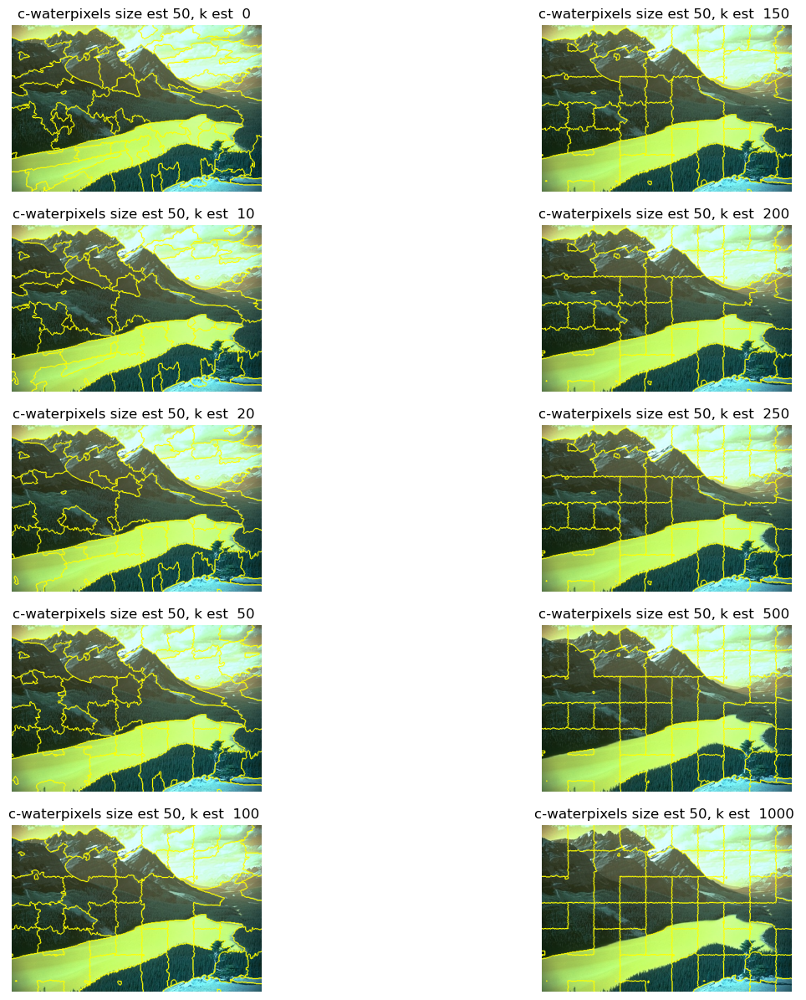

In [38]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
k_l = [0,10,20,50,100,150,200,250,500,1000]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(k_l)):
    ax[i%5,i//5].imshow(test_center(root,size = 50,k=k_l[i]))
    ax[i%5,i//5].set_title("c-waterpixels size est 50, k est  %s " % k_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

    m-waterpixels: size = 50, k = [0,10,20,50,100,150,200,250,500,1000]

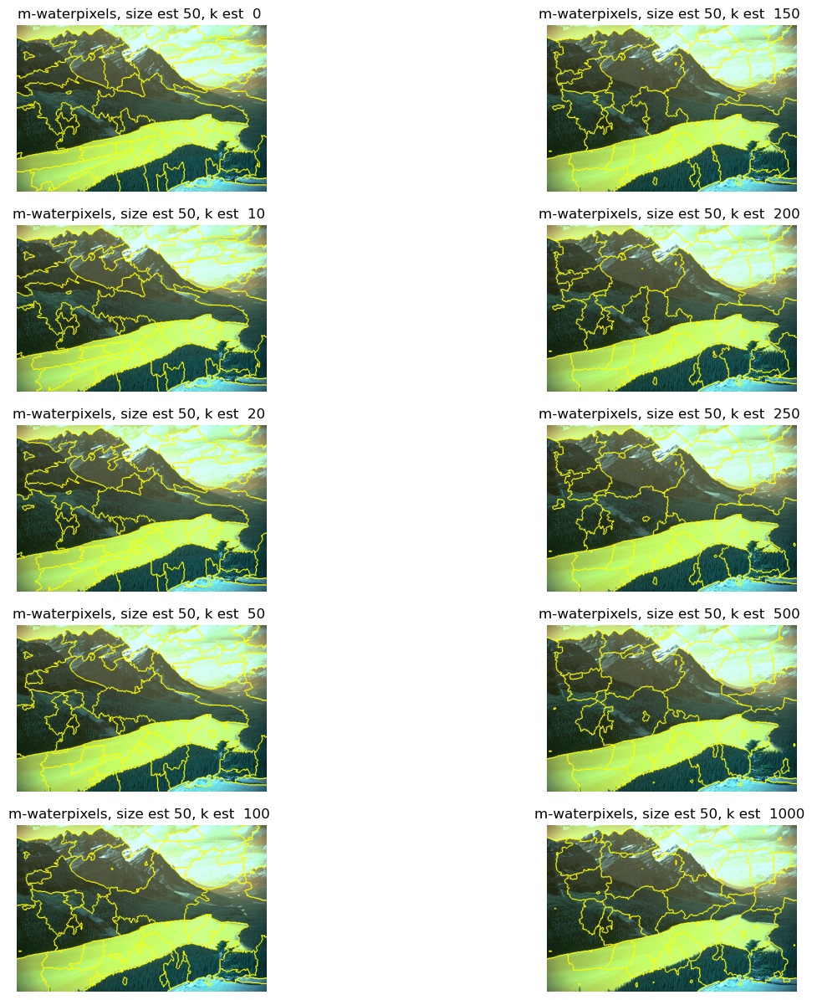

In [39]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
k_l = [0,10,20,50,100,150,200,250,500,1000]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(k_l)):
    ax[i%5,i//5].imshow(test_marker(root,size = 50, k=k_l[i]))
    ax[i%5,i//5].set_title("m-waterpixels, size est 50, k est  %s " % k_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

    Précise de k :[5,10,15,20,25,30,35,40,45,50]

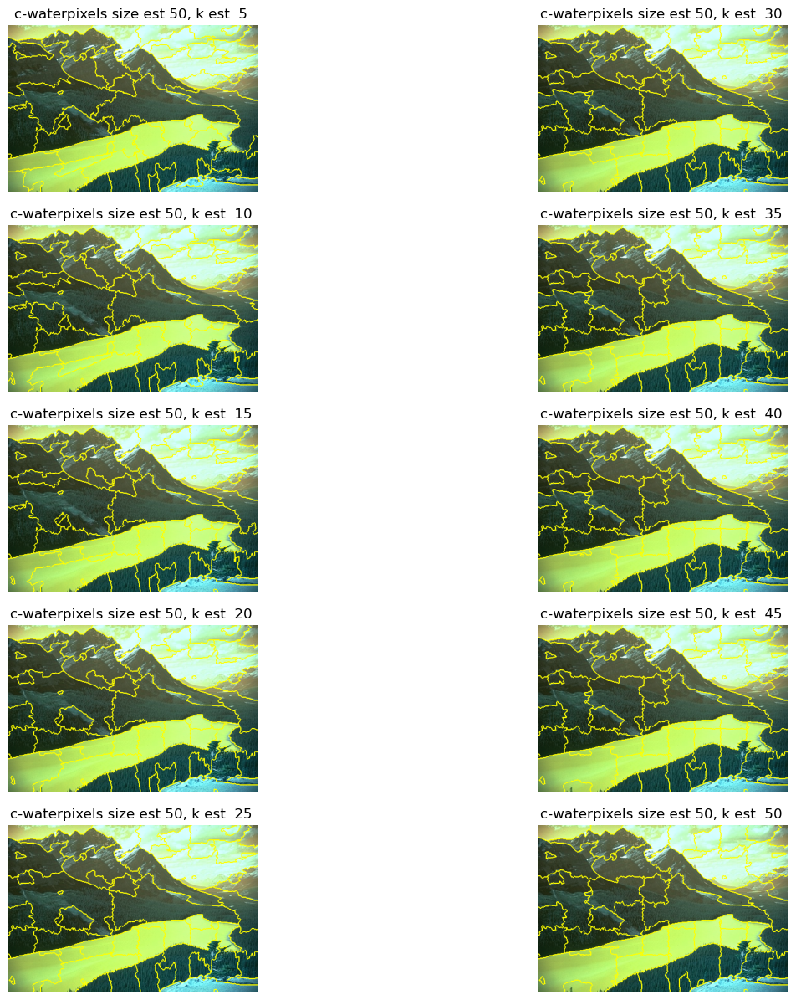

In [40]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
k_l = [5,10,15,20,25,30,35,40,45,50]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(k_l)):
    ax[i%5,i//5].imshow(test_center(root,size = 50,k=k_l[i]))
    ax[i%5,i//5].set_title("c-waterpixels size est 50, k est  %s " % k_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

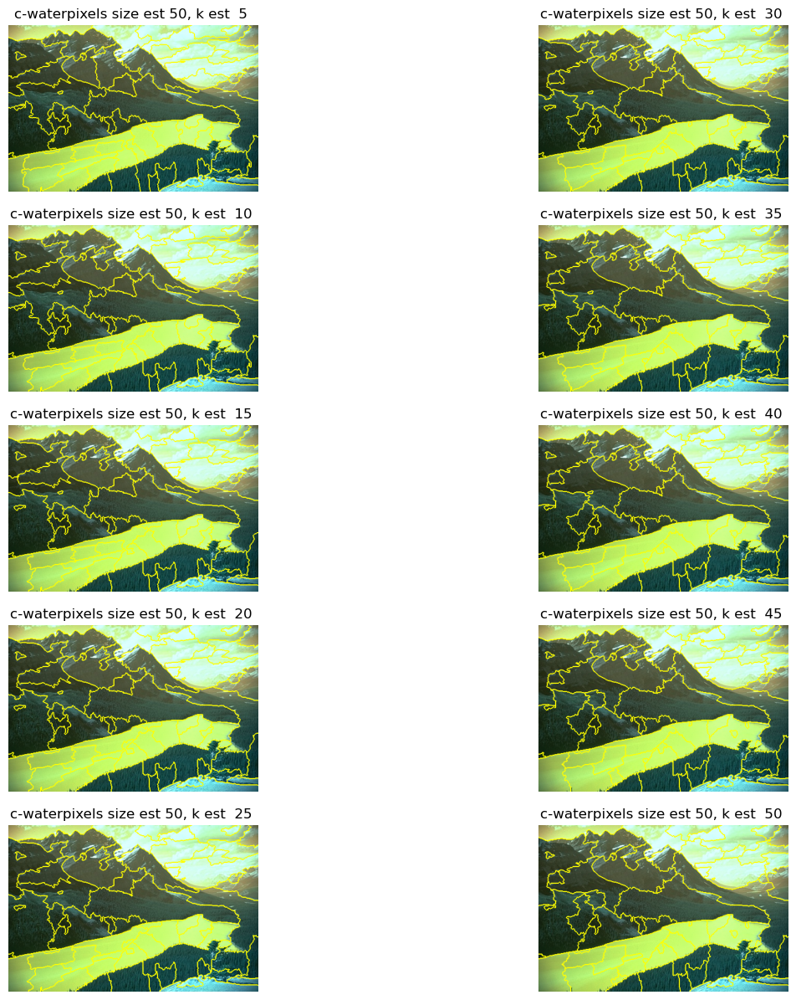

In [41]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
k_l = [5,10,15,20,25,30,35,40,45,50]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(k_l)):
    ax[i%5,i//5].imshow(test_marker(root,size = 50,k=k_l[i]))
    ax[i%5,i//5].set_title("c-waterpixels size est 50, k est  %s " % k_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

    Centres: size = [10,20,30,40,50,60,70,80,90,100], k = 0

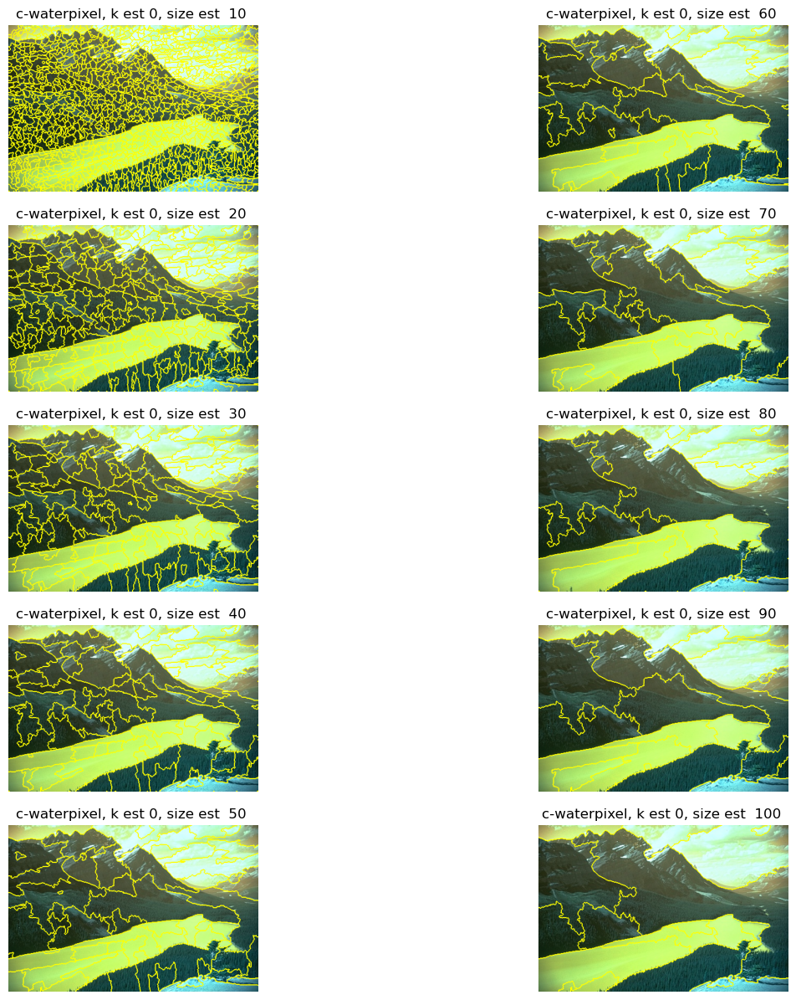

In [42]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
size_l = [10,20,30,40,50,60,70,80,90,100]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(size_l)):
    ax[i%5,i//5].imshow(test_center(root,size = size_l[i], k = 0))
    ax[i%5,i//5].set_title("c-waterpixel, k est 0, size est  %s " % size_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

    Marqueurs: size = [10,20,30,40,50,60,70,80,90,100], k = 0

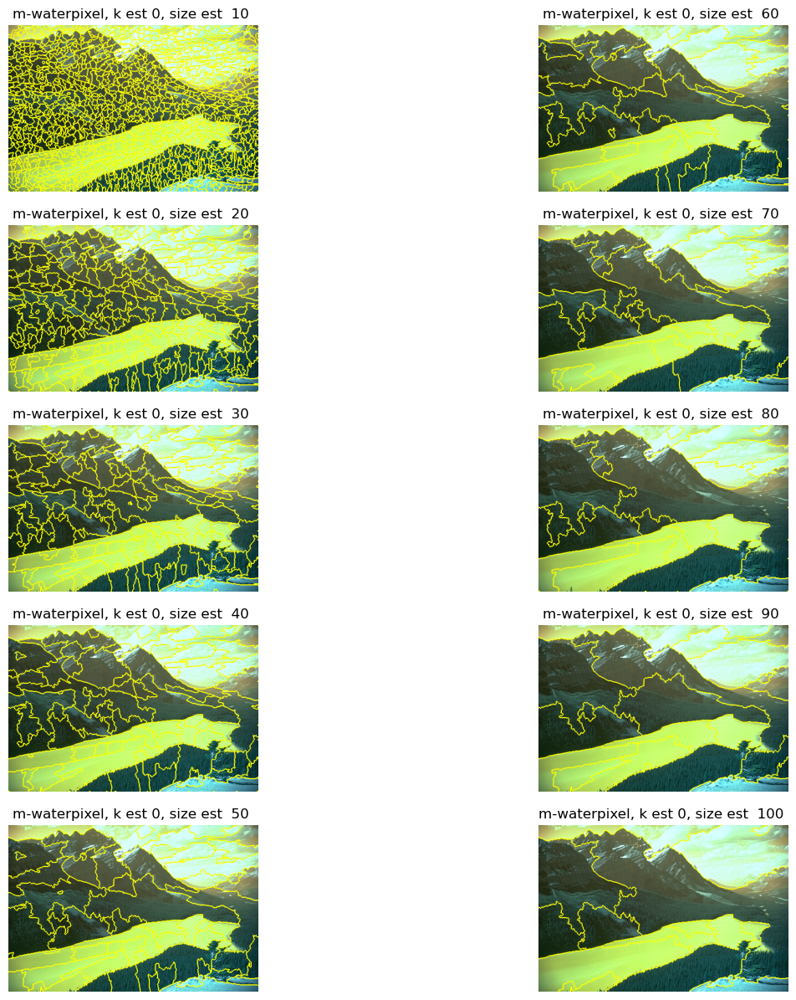

In [43]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
size_l = [10,20,30,40,50,60,70,80,90,100]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(size_l)):
    ax[i%5,i//5].imshow(test_marker(root,size = size_l[i], k = 0))
    ax[i%5,i//5].set_title("m-waterpixel, k est 0, size est  %s " % size_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

    Centres: size = [10,20,30,40,50,60,70,80,90,100], k = 20

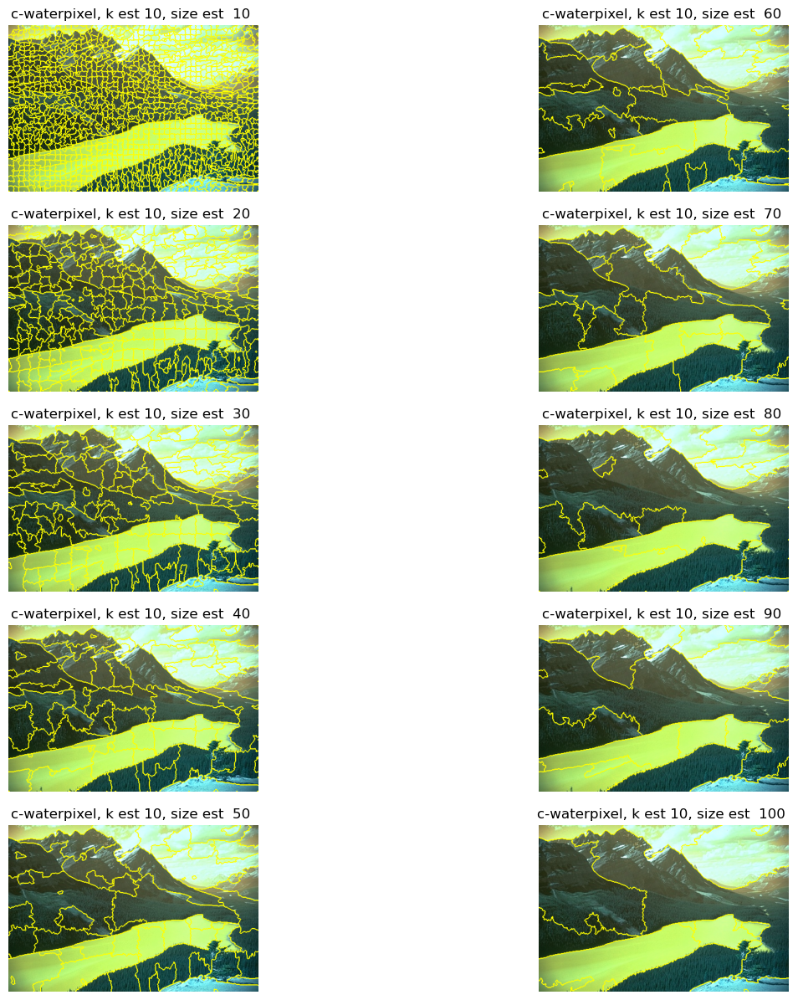

In [44]:
root = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
size_l = [10,20,30,40,50,60,70,80,90,100]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(size_l)):
    ax[i%5,i//5].imshow(test_center(root,size = size_l[i], k = 20))
    ax[i%5,i//5].set_title("c-waterpixel, k est 10, size est  %s " % size_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

    Marqueurs: size = [10,20,30,40,50,60,70,80,90,100], k = 20

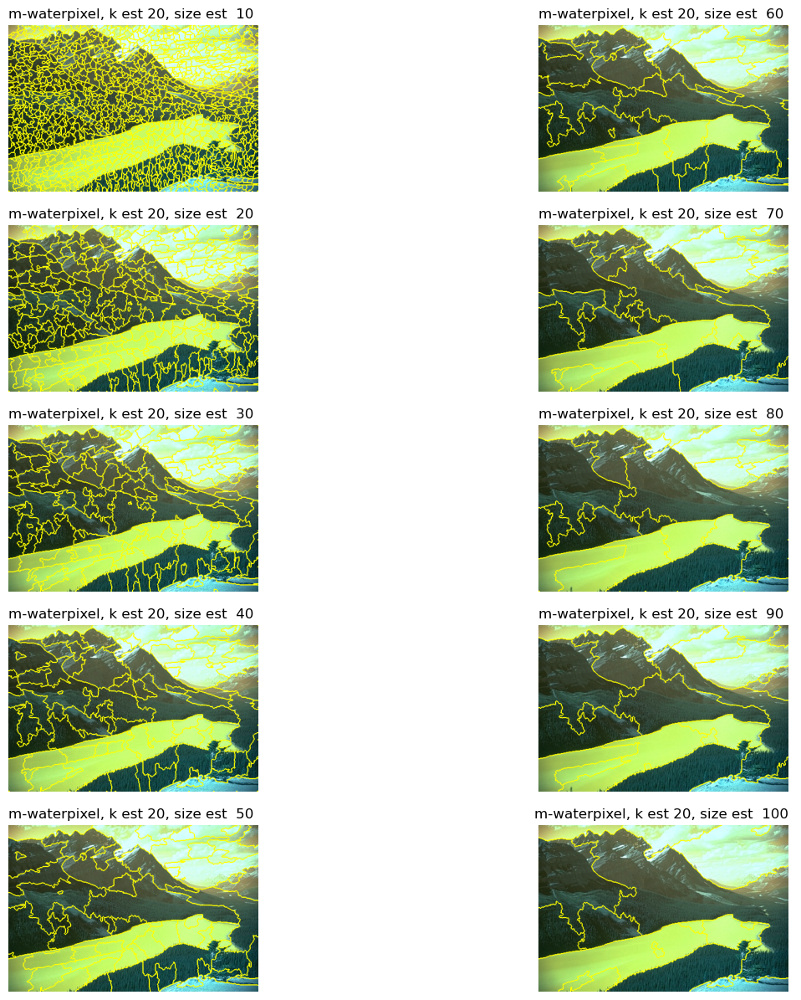

In [45]:
img_grayroot = "/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/images/train/176035.jpg"
size_l = [10,20,30,40,50,60,70,80,90,100]
fig, ax = plt.subplots(5,2, figsize=(15, 15), sharex=True, sharey=True)
for i in range(len(size_l)):
    ax[i%5,i//5].imshow(test_marker(root,size = size_l[i], k = 10))
    ax[i%5,i//5].set_title("m-waterpixel, k est 20, size est  %s " % size_l[i])
    ax[i%5,i//5].axis('off')
plt.show()

# Contour Denstiy

In [46]:
def contour_densite_marker(image, size, k):
    gradient = sp_regularize_marker(image,size,k) 
    markers = label(image,size)
    labels = watershed(gradient, markers)
    boundaries = find_boundaries(labels)
    sc = np.where(boundaries == True, 1, 0).sum()
    sp = ( 2 * (N+M) - 4)
    return ( (0.5 * sc + sp)/( N*M ))

In [47]:
def contour_densite_center(image, size, k):
    gradient = sp_regularize_center(image,size,k) 
    markers = label(image,size)
    labels = watershed(gradient, markers)
    boundaries = find_boundaries(labels)
    sc = np.where(boundaries == True, 1, 0).sum()
    sp = ( 2 * (N+M) - 4)
    return ( (0.5 * sc + sp)/( N*M ))

In [96]:
size = [size for size in range(10, 251, 10)]
cd0m =[]
cd20m =[]
cd200m =[]
cd0c=[]
cd20c =[]
cd200c =[]
for i in size:
    cd0m.append(contour_densite_marker(img_gray, i, k = 0))
    cd20m.append(contour_densite_marker(img_gray, i, k = 20))
    cd200m.append(contour_densite_marker(img_gray, i, k = 200))
    cd0c.append(contour_densite_center(img_gray, i, k = 0))
    cd20c.append(contour_densite_center(img_gray, i, k = 20))
    cd200c.append(contour_densite_center(img_gray, i, k = 200))

    c-waterpixel: la relation entre size de cellule et la densité de contour, pour size de 10 à 250.

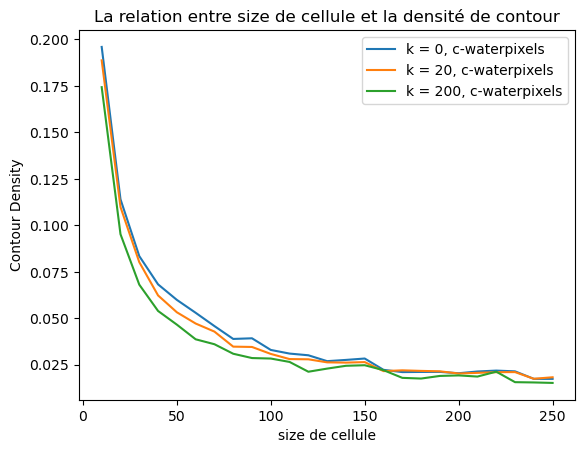

In [52]:
plt.title("La relation entre size de cellule et la densité de contour")
plt.xlabel('size de cellule')
plt.ylabel('Contour Density')
plt.plot(size, cd0c,label = 'k = 0, c-waterpixels')
plt.plot(size, cd20c,label = 'k = 20, c-waterpixels')
plt.plot(size, cd200c,label = 'k = 200, c-waterpixels')
plt.legend()
plt.show()

    m-waterpixel: la relation entre size de cellule et la densité de contour, pour size de 10 à 250.

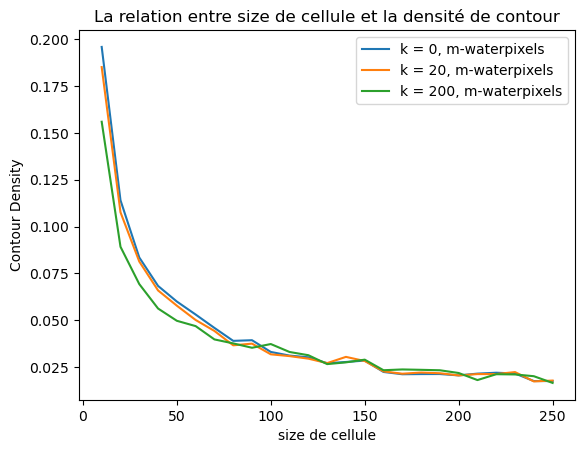

In [53]:
plt.title("La relation entre size de cellule et la densité de contour")
plt.xlabel('size de cellule')
plt.ylabel('Contour Density')
plt.plot(size, cd0m,label = 'k = 0, m-waterpixels')
plt.plot(size, cd20m,label = 'k = 20, m-waterpixels')
plt.plot(size, cd200m,label = 'k = 200, m-waterpixels')
plt.legend()
plt.show()

In [54]:
k_l =  [0,10,20,50,100,150,200,250,500,1000]
size1 = 20
size2 = 50
size3 = 100
cds20m =[]
cds50m =[]
cds100m = []
cds20c =[]
cds50c =[]
cds100c = []
for i in k_l:
    cds20m.append(contour_densite_marker(img_gray, size1, k = i))
    cds50m.append(contour_densite_marker(img_gray, size2, k = i))
    cds100m.append(contour_densite_marker(img_gray, size3, k = i))
    cds20c.append(contour_densite_center(img_gray, size1, k = i))
    cds50c.append(contour_densite_center(img_gray, size2, k = i))
    cds100c.append(contour_densite_center(img_gray, size3, k = i))

    c-waterpixel: la relation entre k et la densité de contour, pour k = [0,10,20,50,100,150,200,250,500,1000]

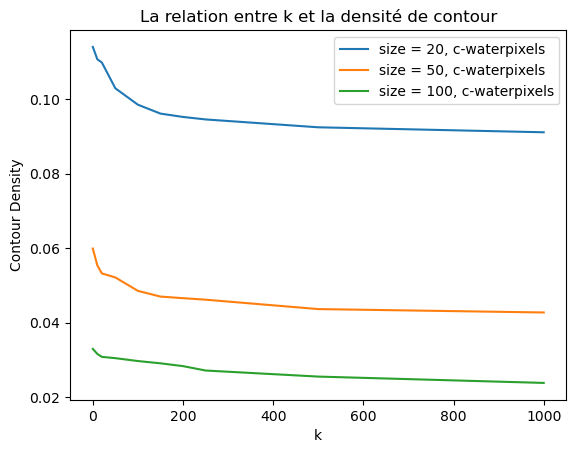

In [57]:
plt.title("La relation entre k et la densité de contour")
plt.xlabel('k')
plt.ylabel('Contour Density')
plt.plot(k_l, cds20c,label = 'size = 20, c-waterpixels')
plt.plot(k_l, cds50c,label = 'size = 50, c-waterpixels')
plt.plot(k_l, cds100c,label = 'size = 100, c-waterpixels')
plt.legend()
plt.show()

In [97]:
    m-waterpixel: la relation entre k et la densité de contour, pour k = [0,10,20,50,100,150,200,250,500,1000]

SyntaxError: illegal target for annotation (3866134204.py, line 1)

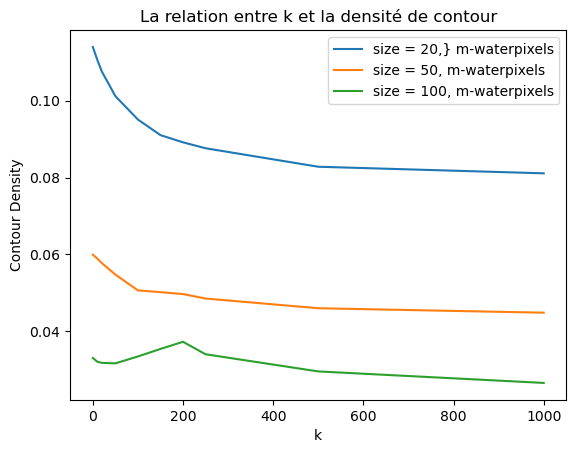

In [58]:
plt.title("La relation entre k et la densité de contour")
plt.xlabel('k')
plt.ylabel('Contour Density')
plt.plot(k_l, cds20m,label = 'size = 20,} m-waterpixels')
plt.plot(k_l, cds50m,label = 'size = 50, m-waterpixels')
plt.plot(k_l, cds100m,label = 'size = 100, m-waterpixels')
plt.legend()
plt.show()

# boundary-recall

In [59]:
import scipy.io as scio
detaFile = '/Users/xiyuxuan/Desktop/M1S2/projet/BSR3/BSDS500/train/176035.mat'

In [60]:
def bandaries_center(image, size, k):
    gradient = sp_regularize_center(image,size,k) 
    markers = label(image,size)
    labels = watershed(gradient, markers)
    boundaries = find_boundaries(labels)
    return boundaries

In [61]:
def bandaries_marker(image, size, k):
    gradient = sp_regularize_marker(image,size,k) 
    markers = label(image,size)
    labels = watershed(gradient, markers)
    boundaries = find_boundaries(labels)
    return boundaries

    liste de GT:

In [62]:
liste_GT = []
data = scio.loadmat(detaFile)
img_fin = data['ucm2']
for i in range(N):
    for j in range(M):
        if img_fin[i,j] != 0:
            liste_GT.append([i,j])

    la distance minimal entre chaque pixel et contour de waterpixels

In [63]:
m = [[4,3,4],[3,0,3],[4,3,4]]
# la distance minimal entre chaque pixel et contour
def distance_C(image):
    grad = SobelDetector(image)
    N,M = image.shape
    d0 = image.copy()
    d1 = imagePad(image)
    for i in range(N):
        for j in range(M):
            d1[i,j] = min(d0[i,j],d1[i-1,j]+3,d1[i-1,j-1]+4,d1[i,j-1]+3,d1[i,j+1]+4,d1[i-1,j+1]+3,d1[i+1,j-1]+3)
    d = d1[1:N+1,1:M+1]
    d2 = imagePad(d)
    for i in range(N,0,-1):
        for j in range(M,0,-1):
            d2[i,j] = min(d1[i,j],d2[i+1,j]+3,d2[i+1,j+1]+4,d2[i,j+1]+3,d2[i,j-1]+4,d2[i+1,j-1]+3,d2[i-1,j+1]+3)
    d2 = d2/3
    return d2[1:N+1,1:M+1]

In [64]:
def d_GT_C(boundaries, liste_GT):
    d0 = 0
    d1 = 0
    d2 = 0
    d3 = 0
    d4 = 0
    d5 = 0
    d6 = 0
    d7 = 0
    d8 = 0
    d9 = 0
    d10 = 0
    img2 = np.where(boundaries == True, 0, 10**18) # Sur waterpixels, les contours en 0, les autres en 255 (initialisation)
    ss = distance_C(img2) # la distance minimale entre tous les pixels et contours de waterpixels
    # Trouver le pixels de toutes les positions de groud-truth 
    for (i,j) in liste_GT:
        if ss[i,j] == 0:
            d0 = d0 + 1
        elif ss[i,j] == 1:
            d1 = d1 + 1
        elif ss[i,j] == 2:
            d2 = d2 + 1
        elif ss[i,j] == 3:
            d3 = d3 + 1
        elif ss[i,j] == 4:
            d4 = d4 + 1
        elif ss[i,j] == 5:
            d5 = d5 + 1    
        elif ss[i,j] == 6:
            d6 = d6 + 1
        elif ss[i,j] == 7:
            d7 = d7 + 1
        elif ss[i,j] == 8:
            d8 = d8 + 1
        elif ss[i,j] == 9:
            d9 = d9 + 1
        elif ss[i,j] == 10:
            d10 = d10 + 1
    return (d0,d1,d2,d3,d4,d5,d6,d7,d8,d9,d10)

    l'histogramme de la distance entre GT et Waterpixels de 0 à 10

/var/folders/tv/dhddtcws5ns5n1c96qzgjq7c0000gn/T/ipykernel_74676/2994379578.py:8: RuntimeWarning: invalid value encountered in sqrt
  gradient = np.sqrt(Gx**2 + Gy**2)


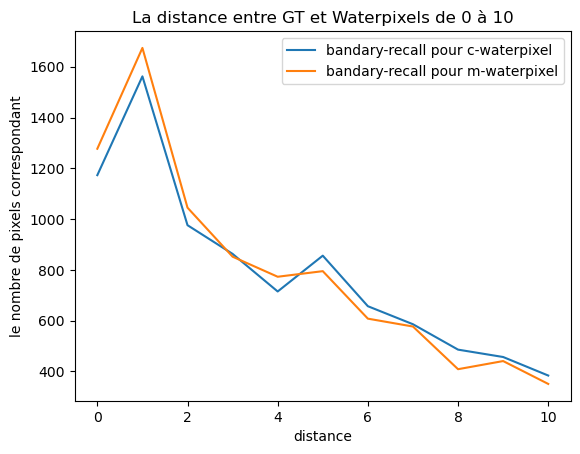

In [65]:
size = 50 
k = 20
bc = bandaries_center(img_gray, size, k)
bm = bandaries_marker(img_gray, size, k)
y_liste_bc = d_GT_C(bc, liste_GT)
y_liste_bm = d_GT_C(bm, liste_GT)
x_liste = [0,1,2,3,4,5,6,7,8,9,10]
fig, ax = plt.subplots()
plt.title("La distance entre GT et Waterpixels de 0 à 10")
plt.xlabel('distance')
plt.ylabel('le nombre de pixels correspondant')
plt.plot(x_liste, y_liste_bc, label = 'bandary-recall pour c-waterpixel')
plt.plot(x_liste, y_liste_bm, label = 'bandary-recall pour m-waterpixel')
plt.legend()
plt.show()

In [66]:
def BR(boundaries, liste_GT):
    d = d_GT_C(boundaries, liste_GT)
    return (d[0]+d[1]+d[2])/len(liste_GT)

In [71]:
size = [size for size in range(10, 251, 10)]
br0m =[]
br20m =[]
br200m =[]
br0c=[]
br20c =[]
br200c =[]
for i in size:
    br0m.append(BR(bandaries_marker(img_gray, i, k = 0),liste_GT))
    br20m.append(BR(bandaries_marker(img_gray, i, k = 20),liste_GT))
    br200m.append(BR(bandaries_marker(img_gray, i, k = 200),liste_GT))
    br0c.append(BR(bandaries_center(img_gray, i, k = 0),liste_GT))
    br20c.append(BR(bandaries_center(img_gray, i, k = 20),liste_GT))
    br200c.append(BR(bandaries_marker(img_gray, i, k = 200),liste_GT))



/var/folders/tv/dhddtcws5ns5n1c96qzgjq7c0000gn/T/ipykernel_74676/2994379578.py:8: RuntimeWarning: invalid value encountered in sqrt
  gradient = np.sqrt(Gx**2 + Gy**2)


    c-waterpixel: La relation entre size de cellule et boundary-recall, pour size de 0 à 250

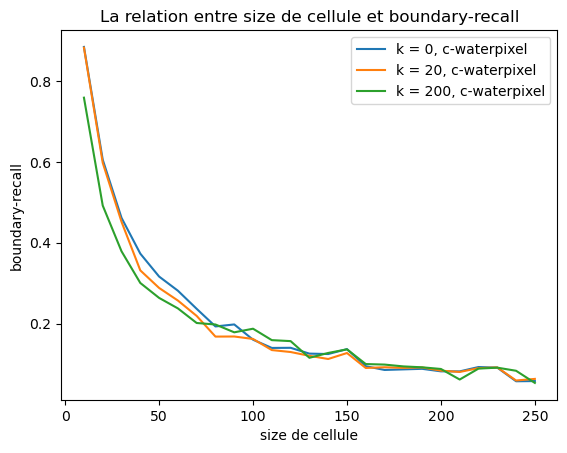

In [85]:
plt.title("La relation entre size de cellule et boundary-recall")
plt.xlabel('size de cellule')
plt.ylabel('boundary-recall')
plt.plot(size, br0c,label = 'k = 0, c-waterpixel')
plt.plot(size, br20c,label = 'k = 20, c-waterpixel')
plt.plot(size, br200c,label = 'k = 200, c-waterpixel')
plt.legend()
plt.show()

    m-waterpixel: La relation entre size de cellule et boundary-recall, pour size de 0 à 250

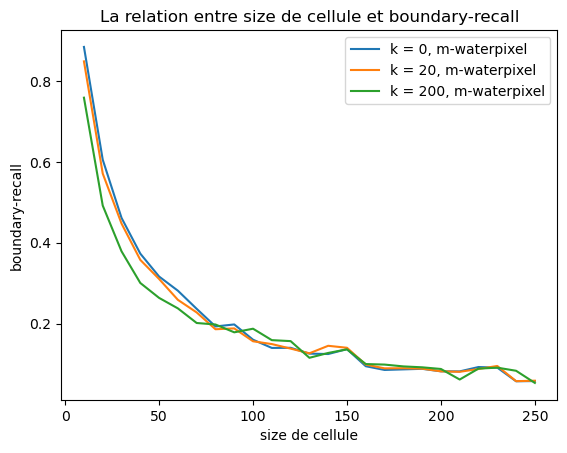

In [86]:
plt.title("La relation entre size de cellule et boundary-recall")
plt.xlabel('size de cellule')
plt.ylabel('boundary-recall')
plt.plot(size, br0m,label = 'k = 0, m-waterpixel')
plt.plot(size, br20m,label = 'k = 20, m-waterpixel')
plt.plot(size, br200m,label = 'k = 200, m-waterpixel')
plt.legend()
plt.show()

In [69]:
k_l = [ 0, 10, 20, 50, 100, 150, 200, 250, 500, 1000]
size1 = 20
size2 = 50
size3 = 100
b20c =[]
b50c =[]
b100c = []
for i in k_l:
    b20c.append(BR(bandaries_center(img_gray, size1, k = i),liste_GT))
    b50c.append(BR(bandaries_center(img_gray, size2, k = i),liste_GT))
    b100c.append(BR(bandaries_center(img_gray, size3, k = i),liste_GT))

/var/folders/tv/dhddtcws5ns5n1c96qzgjq7c0000gn/T/ipykernel_74676/2994379578.py:8: RuntimeWarning: invalid value encountered in sqrt
  gradient = np.sqrt(Gx**2 + Gy**2)


    c-waterpixel: La relation entre size de cellule et boundary-recall, pour k =  [ 0, 10, 20, 50, 100, 150, 200, 250, 500, 1000]

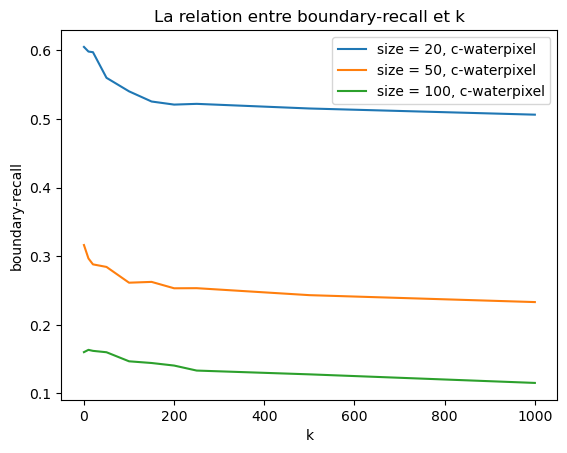

In [70]:
plt.title("La relation entre boundary-recall et k")
plt.xlabel('k')
plt.ylabel('boundary-recall')
plt.plot(k_l, b20c,label = 'size = 20, c-waterpixel')
plt.plot(k_l, b50c,label = 'size = 50, c-waterpixel')
plt.plot(k_l, b100c,label = 'size = 100, c-waterpixel')
plt.legend()
plt.show()

In [67]:
k_l =  [ 0, 10, 20, 50, 100, 150, 200, 250, 500, 1000]
size1 = 20
size2 = 50
size3 = 100
b20m =[]
b50m =[]
b100m = []

for i in k_l:
    b20m.append(BR(bandaries_marker(img_gray, size1, k = i),liste_GT))
    b50m.append(BR(bandaries_marker(img_gray, size2, k = i),liste_GT))
    b100m.append(BR(bandaries_marker(img_gray, size3, k = i),liste_GT))

/var/folders/tv/dhddtcws5ns5n1c96qzgjq7c0000gn/T/ipykernel_74676/2994379578.py:8: RuntimeWarning: invalid value encountered in sqrt
  gradient = np.sqrt(Gx**2 + Gy**2)


    m-waterpixel: La relation entre size de cellule et boundary-recall, pour k =  [ 0, 10, 20, 50, 100, 150, 200, 250, 500, 1000]

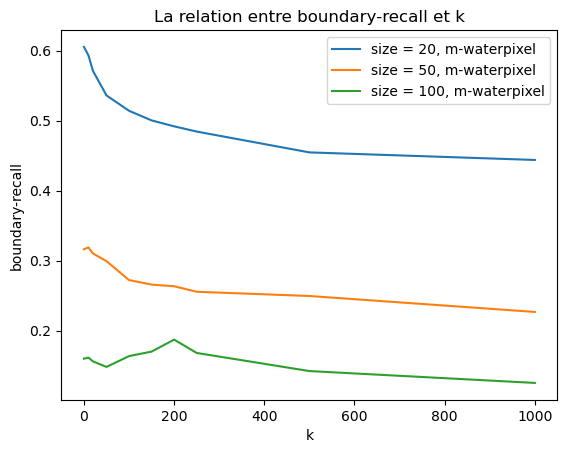

In [68]:
plt.title("La relation entre boundary-recall et k")
plt.xlabel('k')
plt.ylabel('boundary-recall')
plt.plot(k_l, b20m,label = 'size = 20, m-waterpixel')
plt.plot(k_l, b50m,label = 'size = 50, m-waterpixel')
plt.plot(k_l, b100m,label = 'size = 100, m-waterpixel')
plt.legend()
plt.show()

    c-waterpixel: densite de la contour et boundary-recall par la changment de size

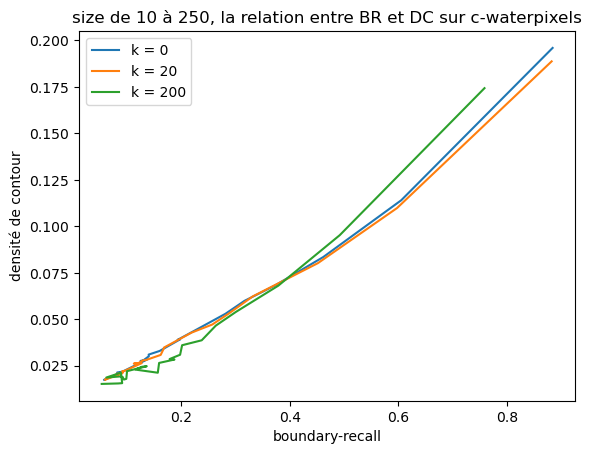

In [89]:
plt.title("size de 10 à 250, la relation entre BR et DC sur c-waterpixels")
plt.xlabel('boundary-recall')
plt.ylabel('densité de contour')
plt.plot(br0c,cd0c,label = 'k = 0')
plt.plot(br20c,cd20c,label = 'k = 20')
plt.plot(br200c,cd200c,label = 'k = 200')
plt.legend()
plt.show()

    m-waterpixel: densite de la contour et boundary-recall par la changment de size

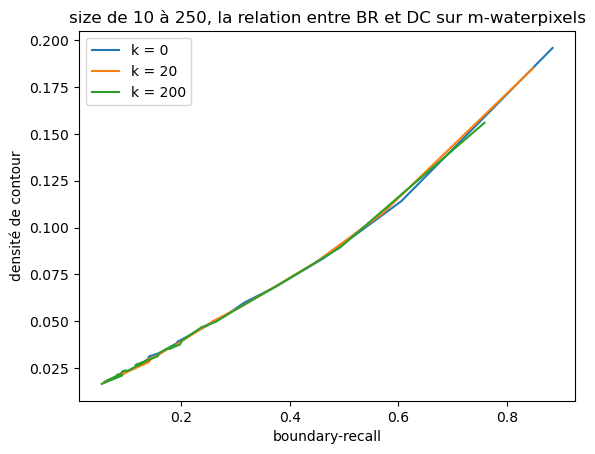

In [90]:
plt.title("size de 10 à 250, la relation entre BR et DC sur m-waterpixels")
plt.xlabel('boundary-recall')
plt.ylabel('densité de contour')
plt.plot(br0m,cd0m,label = 'k = 0')
plt.plot(br20m,cd20m,label = 'k = 20')
plt.plot(br200m,cd200m,label = 'k = 200')
plt.legend()
plt.show()

    c-waterpixel: densite de la contour et boundary-recall par la changment de k

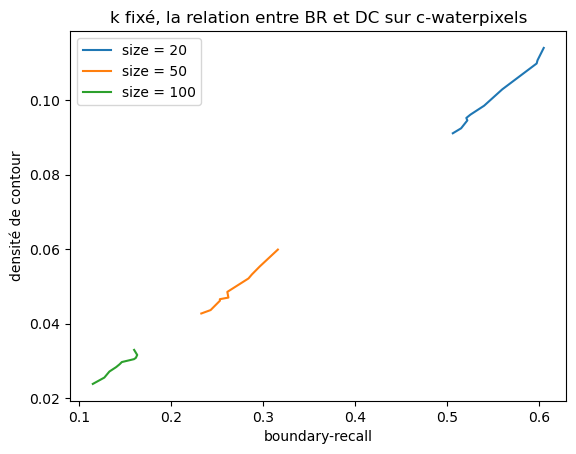

In [87]:
plt.title("k fixé, la relation entre BR et DC sur c-waterpixels")
plt.xlabel('boundary-recall')
plt.ylabel('densité de contour')
plt.plot(b20c,cds20c,label = 'size = 20')
plt.plot(b50c,cds50c,label = 'size = 50')
plt.plot(b100c,cds100c,label = 'size = 100')
plt.legend()
plt.show()

    m-waterpixel: densite de la contour et boundary-recall par la changment de k

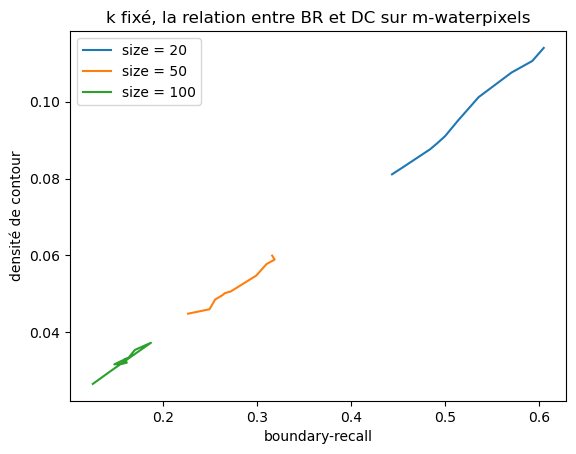

In [88]:
plt.title("k fixé, la relation entre BR et DC sur m-waterpixels")
plt.xlabel('boundary-recall')
plt.ylabel('densité de contour')
plt.plot(b20m,cds20m,label = 'size = 20')
plt.plot(b50m,cds50m,label = 'size = 50')
plt.plot(b100m,cds100m,label = 'size = 100')
plt.legend()
plt.show()

    transformer la taille de la cellule au nombre de superpixels

In [80]:
size = [size for size in range(10, 251, 10)]
nb = []
N,M = img_gray.shape
for s in size:
    nb.append(np.ceil(N/s)*np.ceil(M/s))


    Calculer la densité de contour et le boundary-recall sur SLIC

In [93]:
def SLIC_seg(img,n_segments):
    segments=slic(img, n_segments)
    boundaries = find_boundaries(segments)
    return boundaries
DC_liste = []
BR_liste = []
for i in nb:
    boundaries = SLIC_seg(img_gray,i)
    sc = np.where(boundaries == True, 1, 0).sum()
    sp = ( 2 * (N+M) - 4)
    DC_liste.append( (0.5 * sc + sp)/( N*M ))
    BR_liste.append(BR(boundaries, liste_GT))


/var/folders/tv/dhddtcws5ns5n1c96qzgjq7c0000gn/T/ipykernel_74676/2994379578.py:8: RuntimeWarning: invalid value encountered in sqrt
  gradient = np.sqrt(Gx**2 + Gy**2)


    La relation entre nombre de pixels et densité de coutour

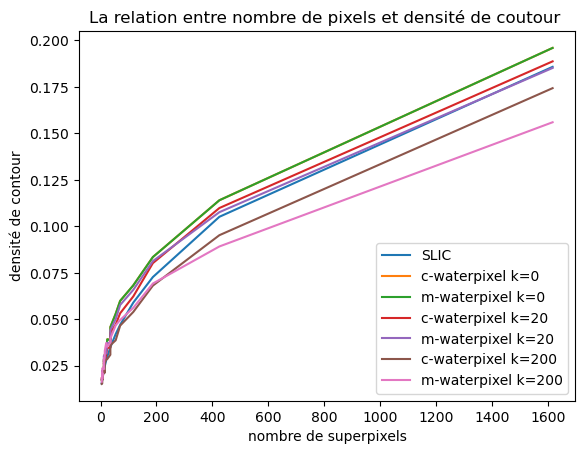

In [94]:
plt.title("La relation entre nombre de pixels et densité de coutour ")
plt.xlabel('nombre de superpixels')
plt.ylabel('densité de contour')
plt.plot(nb,DC_liste,label = 'SLIC')
plt.plot(nb,cd0c,label = 'c-waterpixel k=0')
plt.plot(nb,cd0m,label = 'm-waterpixel k=0')
plt.plot(nb,cd20c,label = 'c-waterpixel k=20')
plt.plot(nb,cd20m,label = 'm-waterpixel k=20')
plt.plot(nb,cd200c,label = 'c-waterpixel k=200')
plt.plot(nb,cd200m,label = 'm-waterpixel k=200')
plt.legend()
plt.show()

    La relation entre le nombre de superpixels et boundary-recall

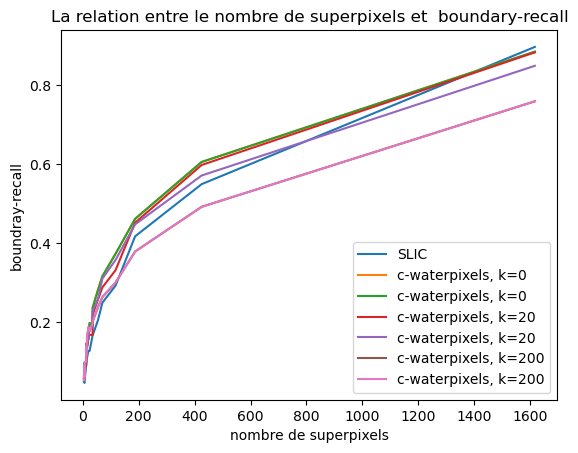

In [95]:
plt.title("La relation entre le nombre de superpixels et boundary-recall")
plt.xlabel('nombre de superpixels')
plt.ylabel('boundray-recall')
plt.plot(nb,BR_liste,label = 'SLIC')
plt.plot(nb,br0c,label = 'c-waterpixels, k=0')
plt.plot(nb,br0m,label = 'c-waterpixels, k=0')
plt.plot(nb,br20c,label = 'c-waterpixels, k=20')
plt.plot(nb,br20m,label = 'c-waterpixels, k=20')
plt.plot(nb,br200c,label = 'c-waterpixels, k=200')
plt.plot(nb,br200m,label = 'c-waterpixels, k=200')
plt.legend()
plt.show()

    Pour trouver les cellules de l'hexagon

In [ ]:
def center_hexagon(image,size):
    N,M = image.shape
    nb_lig = int(N/(size*(np.sqrt(3) / 2)))
    nb_col = int(M/(size*3))    
    center_list=[]
    for i in range(nb_lig+1):
        for j in range(nb_col+1):
            if i%2 == 0:
                center = (size*(np.sqrt(3) / 2)*i, 3*size*j)
            else:
                center = (size*(np.sqrt(3) / 2)*i, 1.5*size + 3*size*j)
            center_list.append(center)
    return center_list


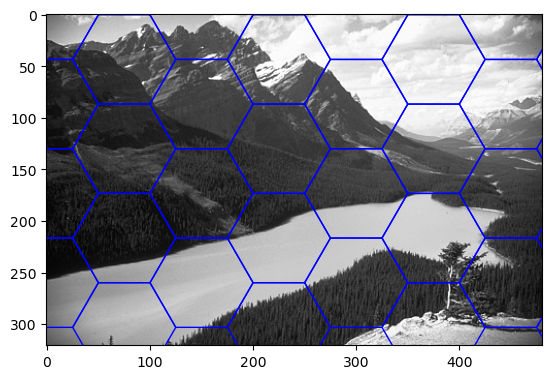

In [ ]:
def draw_hexagon(image,size):
    center_list = center_hexagon(image,size)
    sommet_list = []

    for c in center_list:
        i = c[0]
        j = c[1]
        x = size
        y = x * (np.sqrt(3) / 2)
        p1 = (i - y ,j + x / 2)
        p2 = (i , j + x)
        p3 = (i + y, j + x / 2)
        p4 = (i + y, j - x / 2)
        p5 = (i , j - x)
        p6 = (i - y, j - x / 2)
        sommet_list.append([p1,p2,p3,p4,p5,p6])
        y = [p1[0],p2[0],p3[0],p4[0],p5[0],p6[0],p1[0]]
        x = [p1[1],p2[1],p3[1],p4[1],p5[1],p6[1],p1[1]]
        plt.plot(x,y,'b-',linewidth=1)
    plt.imshow(image,cmap='gray')
    plt.show()

draw_hexagon(img_gray,size=50)
